In [1]:
import matplotlib.pyplot as plt
import numpy as np

from astropy.table import Table
from astropy.io import fits
from astropy.wcs import wcs
import astropy.units as u
from astropy.coordinates import SkyCoord
from astroquery.gaia import Gaia
import warnings
warnings.filterwarnings('ignore')
from astropy.stats import sigma_clipped_stats
from astropy.nddata import NDData
from photutils.psf import extract_stars
from photutils import EPSFBuilder
from photutils.psf import DAOGroup
from photutils.background import MADStdBackgroundRMS, MMMBackground
from astropy.modeling.fitting import LevMarLSQFitter
from astropy.stats import gaussian_sigma_to_fwhm
from photutils.psf import BasicPSFPhotometry
from astropy.visualization import simple_norm
import time
from photutils import CircularAperture
from photutils import aperture_photometry

Created TAP+ (v1.0.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: False
	Port: 80
	SSL Port: 443


#### Load the file that contains three consecutive images

In [2]:
files = 'm35superstampsnobeg'

In [5]:
filelist = np.loadtxt(files,dtype=str)

#### Set the center and size of the region that will be looked at

In [6]:
coord = SkyCoord(ra=92.3201875, dec= 24.30348139, unit=(u.degree, u.degree), frame='icrs')
width = u.Quantity(0.5, u.deg)
height = u.Quantity(0.5, u.deg)

#### Use the Gaia catalog to find the positions of potential stars to be used when making the PSF model

In [7]:
r = Gaia.query_object_async(coordinate=coord, width=width, height=height)

Query finished.


In [8]:
ra = r['ra']
dec = r['dec']
flux = r['phot_rp_mean_flux']
mag = r['phot_rp_mean_mag']

#### Reject stars that are too bright or too faint

In [9]:
brightstars = np.where((mag<15) & (mag>10))

In [10]:
moderatestars = np.where((mag<17) & (mag>8))

In [11]:
raMod = ra[moderatestars]
decMod = dec[moderatestars]

In [12]:
flux = flux[brightstars]
mag = mag[brightstars]
brightstars_length = mag.size
ra = ra[brightstars]
dec = dec[brightstars]

#### We also want stars that are somewhat isolated, so we take out the stars that are too close to another star

In [13]:
goodstars = np.zeros(brightstars_length)
for i in np.arange(brightstars_length):
#for i in np.arange(20):
    rastar1 = ra[i]
    decstar1 = dec[i]
    closestars = np.where(np.sqrt((decMod - decstar1)**2 + ((raMod - rastar1)*(np.cos(decstar1*np.pi/180.0)))**2)<0.005)
    if len(closestars[0]) >1:
        goodstars[i] = -1

In [14]:
starstouse = np.where(goodstars==0)

In [15]:
len(starstouse[0])

317

In [16]:
ra = ra[starstouse]
dec = dec[starstouse]
flux = flux[starstouse]

#### Circle all the stars that we use in the model

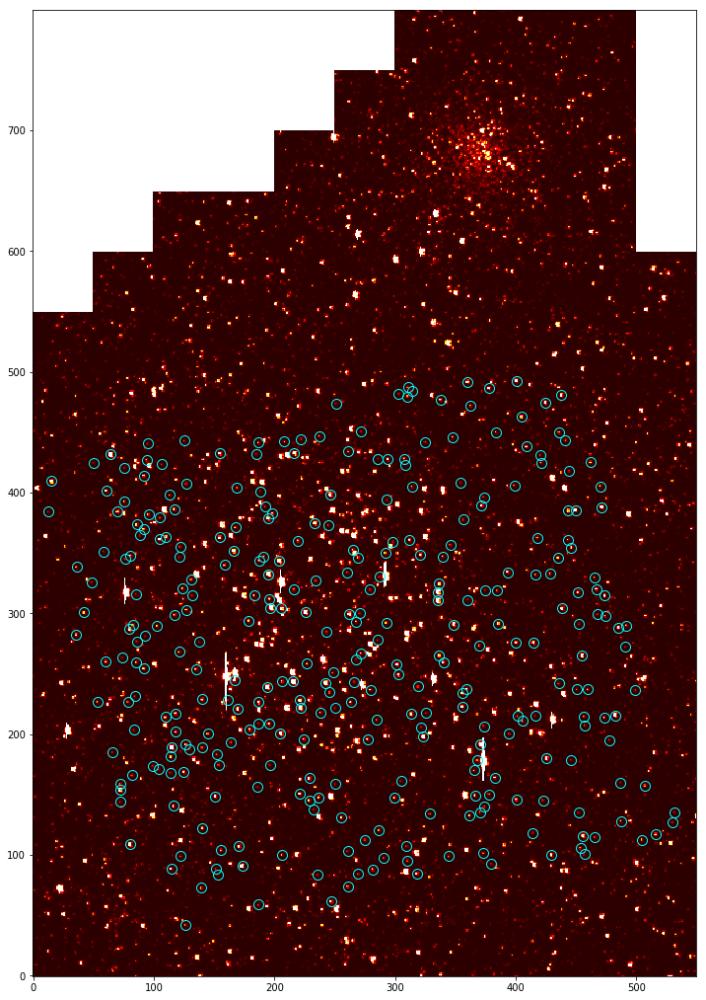

In [17]:
image = fits.getdata(filelist[0])
header = fits.getheader(filelist[0])
wcs_transform = wcs.WCS(header)
c = wcs_transform.wcs_world2pix(np.asarray([ra,dec]).T, 0)
plt.figure(figsize=(24, 18))
plt.imshow(image, cmap='hot', vmin = -100, vmax = 10000, interpolation='None', origin='lower')
plt.plot(c.T[0], c.T[1], marker="o", markersize = 10, markerfacecolor='None', markeredgecolor='cyan', linestyle='None')

#### The right ascension and declination of the star we are looking at 

In [18]:
star1ra = 92.126041
star1dec = 24.441154

#### Loop through the three images and perform photometry

19.725619077682495
26.08969807624817
28.34067988395691
19.621938943862915
18.442791223526
19.324984073638916
21.70269274711609
19.045644760131836
18.969889879226685
19.02562189102173
18.816945791244507
19.807008028030396
18.27995204925537
18.59443688392639
18.886319875717163
24.573081016540527
21.933262825012207
18.725788116455078
20.293596029281616
19.396862983703613
18.76316499710083
20.554548978805542
19.585374116897583
19.85891890525818
18.587048053741455
18.766510009765625
19.37372612953186
18.963022232055664
19.484615325927734
18.619253158569336
19.10402011871338
18.91803503036499
18.929156064987183
18.849327325820923
18.71423602104187
18.631728887557983
18.76203179359436
19.69833207130432
22.072829246520996
25.354541778564453
18.682352781295776
18.86901307106018
18.559736013412476
18.518591165542603
18.550843954086304
19.261923789978027
21.273519039154053
18.919419050216675
19.220205783843994
19.324217081069946
18.697627067565918
18.926832914352417
19.01331400871277
18.318898916

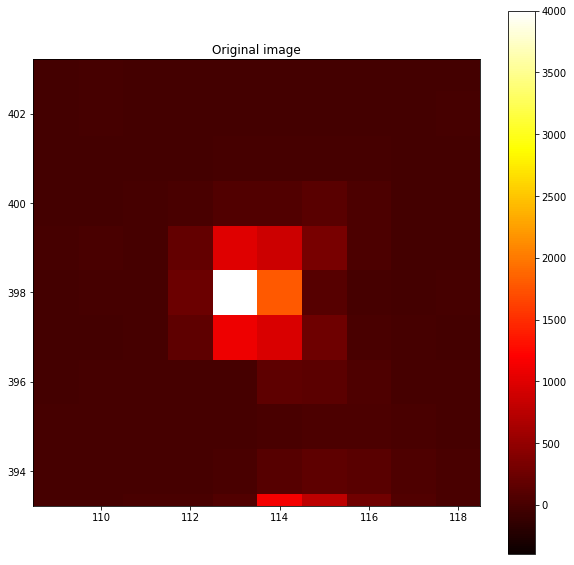

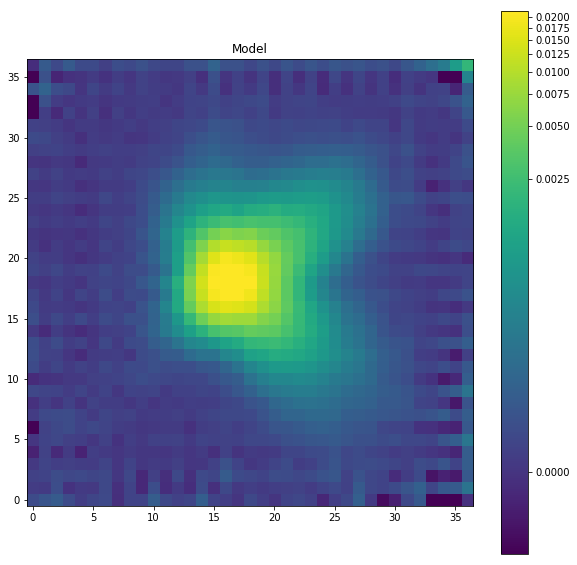

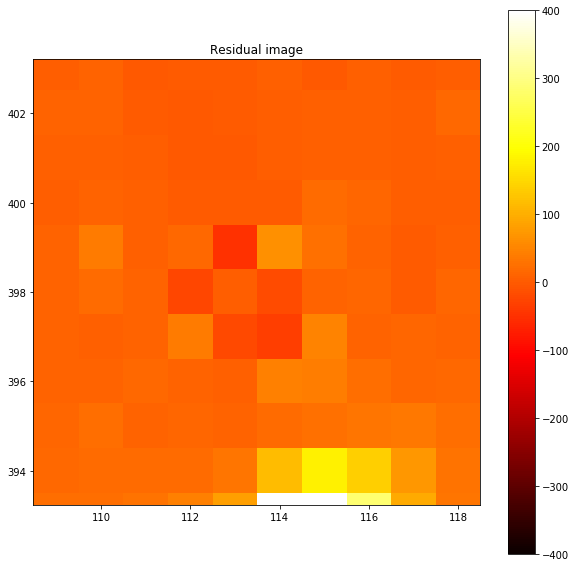

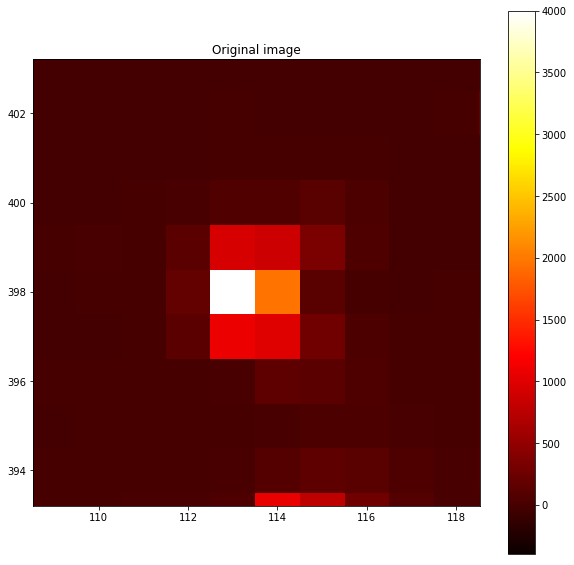

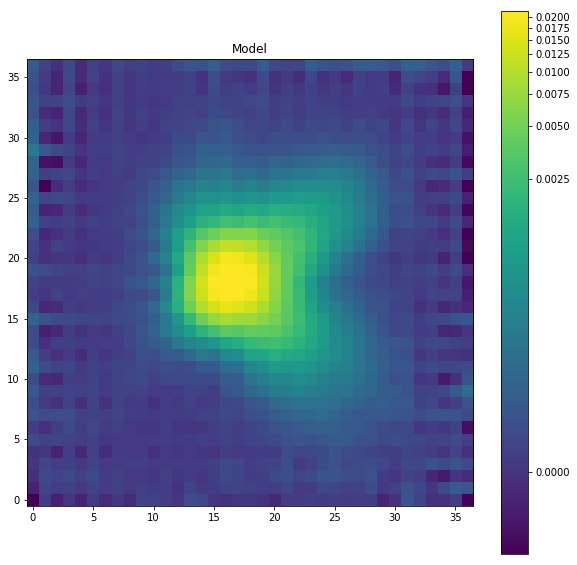

...

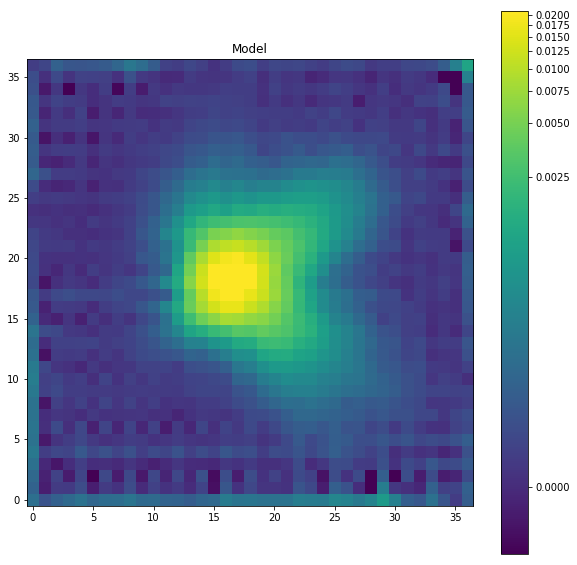

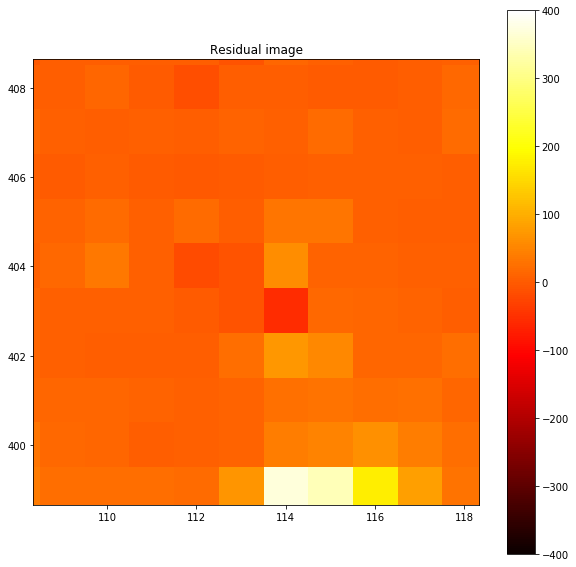

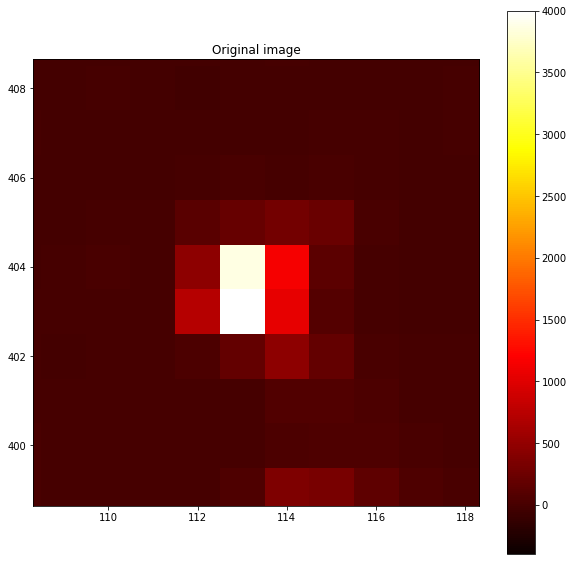

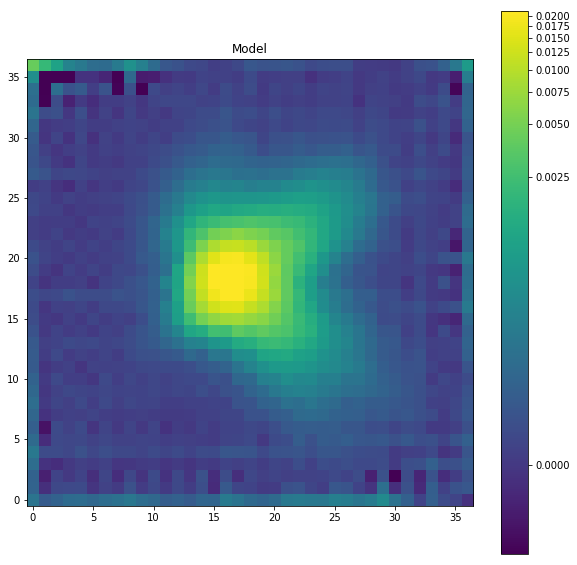

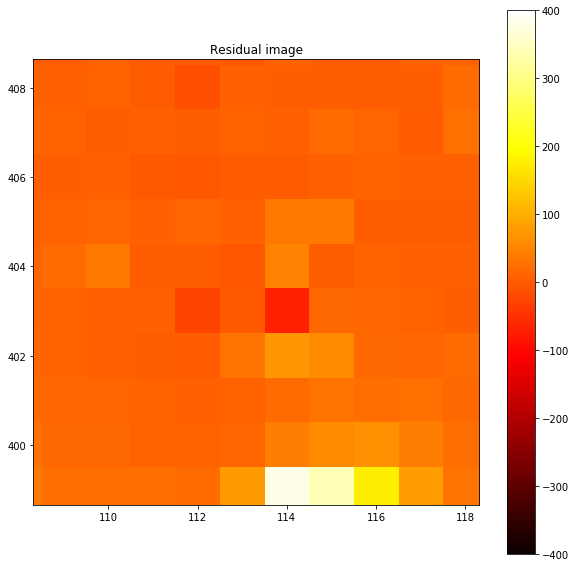

In [19]:
counter =0
times = np.array([])
fluxes= np.array([])
aperture_fluxes = np.array([])
residual_fluxes = np.array([])
uncertainties = np.array([])
oversample = 4

while counter<200:
    start = time.time()
    file = filelist[counter]
    data = fits.getdata(file)
    header = fits.getheader(file)
    times = np.append(times, header['MIDTIME']) 
    
    wcs_transform = wcs.WCS(header)
    xstar1, ystar1 = wcs_transform.wcs_world2pix([[star1ra, star1dec]], 0)[0]
    coords = wcs_transform.wcs_world2pix(np.asarray([ra,dec]).T, 0)
    stars_tbl = Table()
    stars_tbl['x'] = coords.T[0]
    stars_tbl['y'] = coords.T[1]
    
    mean_val, median_val, std_val = sigma_clipped_stats(data, sigma = 2.)
    data -= median_val
    nddata = NDData(data = data)
    stars = extract_stars(nddata, stars_tbl, size = 9)
    epsf_builder = EPSFBuilder(oversampling =oversample, recentering_boxsize = 1, recentering_maxiters = 1,maxiters =10, progress_bar = False)
    epsf, fitted_stars = epsf_builder(stars)
 
    #plot the original image
    plt.figure(figsize=(10, 10))
    plt.imshow(data, cmap='hot', vmin = -400, vmax = 4000, interpolation='None', origin='lower')
    plt.xlim(xstar1 - 5, xstar1+5)
    plt.ylim(ystar1 - 5,ystar1+5)
    plt.colorbar()
    plt.title('Original image')

    norm = simple_norm(epsf.data, 'log', percent = 99.)
    
    #plot the models
    plt.figure(figsize=(10, 10))
    plt.imshow(epsf.data, norm = norm, origin = 'lower', cmap = 'viridis')
    plt.colorbar()
    plt.title('Model')
    
    bkgrms = MADStdBackgroundRMS()
    std = bkgrms(data)
    daogroup = DAOGroup(2.0*0.5*gaussian_sigma_to_fwhm)
    
    epsf.normalization_correction = 1.0/(oversample**2)
    
    psf_model = epsf
    mmm_bkg = MMMBackground()
    fitter = LevMarLSQFitter()
   
    epsf.x_0.fixed = False
    epsf.y_0.fixed = False
    posStar1 = Table(names = ['x_0', 'y_0'], data = [[xstar1], [ystar1]])
    
    photometry = BasicPSFPhotometry(group_maker = daogroup, bkg_estimator = mmm_bkg, psf_model = psf_model, 
                               fitter = fitter, fitshape = (7, 7), aperture_radius = 3)
    result_tab_star1 = photometry(image = data, init_guesses = posStar1)
    residual_image_star1 = photometry.get_residual_image()
    fluxes = np.append(fluxes, result_tab_star1['flux_fit'])
    uncertainties = np.append(uncertainties, result_tab_star1['flux_unc'])

    #perform aperture photometry on the residuals to account for what the model missed
    position = [( result_tab_star1['x_fit']), ( result_tab_star1['y_fit'])]
    aperture = CircularAperture(position, r = 3.)
    phot_table = aperture_photometry(data, aperture)
    aperture_fluxes = np.append(aperture_fluxes, phot_table['aperture_sum'])
    residual_phot_table = aperture_photometry(residual_image_star1, aperture)
    residual_fluxes = np.append(residual_fluxes, residual_phot_table['aperture_sum'])
     
    #plot the residual images
    plt.figure(figsize=(10, 10))
    plt.imshow(residual_image_star1, cmap='hot', vmin = -400, vmax = 400, interpolation='None', origin='lower')
    plt.xlim(xstar1 - 5, xstar1+5)
    plt.ylim(ystar1 - 5,ystar1+5)
    plt.colorbar()
    plt.title('Residual image')
    
    #see how long each iteration takes
    end = time.time()
    print(end - start)
    counter = counter+1

## Now explore the outputs

#### PSF fluxes and uncertainties

In [20]:
fluxes

array([14533.46494013, 14606.3319459 , 15076.0123868 , 15209.45370088,
       14519.17485015, 14826.2001795 , 14730.13040265, 14870.64332518,
       14670.51652966, 14382.81726094, 14225.93798408, 14232.41456793,
       14101.85897667, 14063.13434841, 14128.61212184, 14320.78331801,
       14155.2462622 , 14641.95014232, 14675.67418622, 15103.06766559,
       14466.46484368, 14787.22127859, 14921.85583015, 14614.39152192,
       14740.31519671, 14595.94819076, 14211.32221978, 14051.13602535,
       14036.55397291, 14896.65371925, 15086.02434517, 14973.01336349,
       14653.88709409, 14304.74528629, 14477.86139607, 14010.7106456 ,
       14301.73298902, 14359.42819505, 14498.88569485, 14735.85472478,
       14416.48061325, 14490.85983186, 14514.90094743, 14621.62601272,
       14522.50859427, 14558.64018374, 14522.0211306 , 14272.42192922,
       14253.64986094, 14510.12482897, 14503.36908029, 14368.44991827,
       14466.18866545, 14508.96957713, 14442.31917003, 14763.93896653,
      

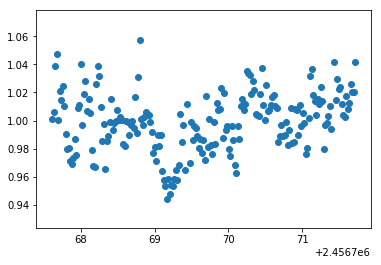

In [25]:
plt.scatter(times, fluxes/np.median(fluxes))

(0.965, 1.025)

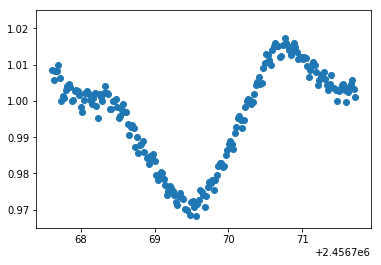

In [28]:
plt.scatter(times, aperture_fluxes/np.median(aperture_fluxes))
plt.ylim(0.965, 1.025)

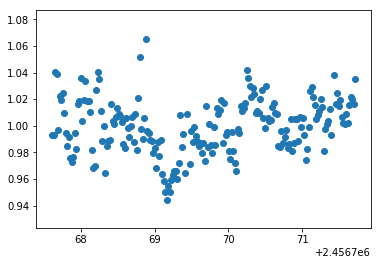

In [30]:
plt.scatter(times, (fluxes + residual_fluxes)/np.median(fluxes+residual_fluxes))

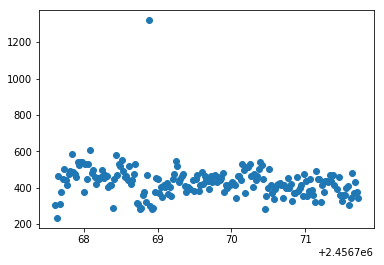

In [29]:
plt.scatter(times, residual_fluxes)

In [21]:
uncertainties

array([ 50.43365955,  67.29417601,  58.87897351,  75.13555479,
        73.72581059,  73.34969843,  74.62780303,  66.94904343,
        63.47913751,  62.26389566,  58.45200466,  70.65551064,
        64.04556805,  65.26754048,  64.68361256,  66.80995062,
        66.22863798,  64.28013425,  70.67052829,  62.87227106,
        65.50595716,  67.68521227,  71.79479181,  71.97793702,
        73.41210101,  61.91454353,  62.53519306,  54.57465008,
        56.26024003,  59.73857586,  69.61067642,  54.23809298,
        59.3889376 ,  55.21489804,  57.43513527,  52.07684134,
        54.45470057,  53.45493662,  54.69254902,  56.2420649 ,
        70.42429228,  56.85945489,  65.90556393,  65.07355305,
        71.39924099,  64.71125034,  60.09955889,  58.77478067,
        62.76499693,  58.27293555,  54.5137333 ,  57.47936889,
        58.22459312,  68.56515704,  58.86735559,  64.00919253,
        68.92507252,  66.63185844,  77.63408288,  64.44538533,
        66.70942087,  65.75998486, 220.44850497,  49.87

#### Residual fluxes within a three pixel aperture

In [22]:
residual_fluxes

array([ 305.20720095,  233.54609739,  465.09699769,  312.17023241,
        374.00556028,  445.61887917,  500.98845993,  442.67908944,
        416.18148133,  474.30556352,  493.68967209,  587.50893631,
        484.70245312,  472.87394437,  460.12290576,  543.22260331,
        522.62503306,  542.40176241,  539.51573403,  374.31254162,
        529.23533462,  448.93566748,  528.08433765,  604.64860721,
        478.12501443,  497.11535873,  457.61681714,  417.37961657,
        455.44775188,  449.65269687,  457.04847487,  494.99749729,
        455.06894734,  467.68183661,  466.53086758,  401.84715801,
        412.04882084,  416.19526073,  289.40523143,  446.20548621,
        578.37024147,  470.74815052,  527.4099284 ,  519.82161509,
        554.51981074,  490.44118496,  460.32177107,  466.02438437,
        443.75389096,  519.97786781,  417.61593473,  444.28209755,
        474.58736346,  532.58942245,  314.20231678,  308.38211346,
        285.07746645,  289.38412757,  360.70881432,  375.78011

#### Aperture fluxes using a three pixel aperture

In [23]:
aperture_fluxes

array([14308.53593984, 14268.924875  , 14306.72383436, 14303.70309947,
       14328.07084738, 14276.58856819, 14187.12760986, 14206.27628963,
       14201.59061058, 14230.07169146, 14246.66748628, 14253.10798561,
       14242.55637628, 14189.82503353, 14191.21944595, 14227.063445  ,
       14231.63109393, 14228.22804371, 14211.46295313, 14163.92834899,
       14146.1184747 , 14190.23544563, 14217.7230539 , 14225.74096761,
       14215.20287135, 14190.43272757, 14177.35058656, 14200.86463289,
       14219.40485215, 14167.75870752, 14121.68654395, 14214.59603228,
       14204.25996804, 14187.2726342 , 14218.49561515, 14245.9584342 ,
       14219.5350607 , 14216.69148247, 14157.43621396, 14155.52664325,
       14187.93837298, 14187.45237527, 14197.64660481, 14166.13404266,
       14120.67833803, 14128.42282955, 14151.68648548, 14176.4540005 ,
       14143.70854284, 14142.97390487, 14098.14790647, 14053.49978004,
       14085.02270156, 14095.02432287, 14082.72493354, 14009.05841413,
      